In [1]:
from functools import partial
from tqdm import tqdm

import torch
from torch.utils.data import DataLoader
from datasets import load_dataset
from transformers import CLIPImageProcessor
from torchvision import transforms

from model import UNet, DiffusionModel
from utils import make_grid

from torchvision.transforms.functional import to_pil_image

In [2]:
from PIL import Image

In [3]:
def transform(image):
    jitter = transforms.Compose([
        transforms.Resize((128,128)),
        transforms.ToTensor(),
     ])
    image_tensors = jitter(image)
    return image_tensors

In [4]:
# load model
model = UNet(in_dim=64,
             dim_mults = (1, 2, 4, 8, 16),
             is_attn = (False, False, False, True, True)
             )
diffusion = DiffusionModel(model = model,
                           num_timesteps=1_000)

In [5]:
diffusion.to(torch.device("cuda:6"))

DiffusionModel(
  (model): UNet(
    (init_conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (time_emb): TimeEmbedding(
      (ln1): Linear(in_features=64, out_features=256, bias=True)
      (act1): GELU()
      (ln2): Linear(in_features=256, out_features=256, bias=True)
    )
    (downs): ModuleList(
      (0): DownBlock(
        (convres): ConvResBlock(
          (norm1): GroupNorm(8, 64, eps=1e-05, affine=True)
          (act1): GELU()
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (norm2): GroupNorm(8, 64, eps=1e-05, affine=True)
          (act2): GELU()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (res): Identity()
          (time_ln): Linear(in_features=256, out_features=64, bias=True)
          (time_act): GELU()
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (attn): Identity()
      )
      (1): DownBlock(
        (convres): ConvResBl

## Butterfly

In [6]:
diffusion.load_state_dict(torch.load("best_model_butterfly.pt"), strict=False)

<All keys matched successfully>

In [8]:
x1 = Image.open("images/butterfly1.jpeg")
x2 = Image.open("images/butterfly2.jpeg")
x1_tensor = transform(x1).to(torch.device("cuda:6"))
x2_tensor = transform(x2).to(torch.device("cuda:6"))

In [9]:
imgs = []

imgs.append(x1_tensor.squeeze(0))
for j in range(1, 10):
    imgs.append(diffusion.interpolate(x1_tensor.unsqueeze(0), x2_tensor.unsqueeze(0), t=0, lam=j/10).squeeze(0))
imgs.append(x2_tensor.squeeze(0))

for i in range(124, 1000, 125):
    print(i)
    imgs.append(x1_tensor.squeeze(0))
    for j in range(1, 10):
        imgs.append(diffusion.interpolate(x1_tensor.unsqueeze(0), x2_tensor.unsqueeze(0), t=i, lam=j/10).squeeze(0))
    imgs.append(x2_tensor.squeeze(0))

0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]


124


124it [00:02, 48.36it/s]
124it [00:02, 58.64it/s]
124it [00:02, 58.76it/s]
124it [00:02, 58.49it/s]
124it [00:02, 59.00it/s]
124it [00:02, 58.73it/s]
124it [00:02, 58.88it/s]
124it [00:02, 57.62it/s]
124it [00:02, 58.18it/s]


249


249it [00:04, 58.59it/s]
249it [00:04, 58.46it/s]
249it [00:04, 58.62it/s]
249it [00:04, 58.71it/s]
249it [00:04, 58.69it/s]
249it [00:04, 57.79it/s]
249it [00:04, 58.16it/s]
249it [00:04, 58.34it/s]
249it [00:04, 58.67it/s]


374


374it [00:06, 58.60it/s]
374it [00:06, 58.17it/s]
374it [00:06, 56.51it/s]
374it [00:06, 57.66it/s]
374it [00:06, 58.47it/s]
374it [00:06, 58.57it/s]
374it [00:06, 58.87it/s]
374it [00:06, 58.53it/s]
374it [00:06, 58.60it/s]


499


499it [00:08, 57.92it/s]
499it [00:08, 58.18it/s]
499it [00:08, 58.32it/s]
499it [00:08, 57.51it/s]
499it [00:08, 57.98it/s]
499it [00:08, 58.13it/s]
499it [00:08, 57.81it/s]
499it [00:08, 58.92it/s]
499it [00:08, 58.90it/s]


624


624it [00:10, 58.82it/s]
624it [00:10, 58.88it/s]
624it [00:10, 58.96it/s]
624it [00:10, 59.00it/s]
624it [00:10, 58.95it/s]
624it [00:10, 59.09it/s]
624it [00:10, 59.22it/s]
624it [00:10, 59.15it/s]
624it [00:10, 58.78it/s]


749


749it [00:12, 58.43it/s]
749it [00:12, 58.46it/s]
749it [00:12, 58.81it/s]
749it [00:12, 58.73it/s]
749it [00:12, 58.96it/s]
749it [00:12, 58.41it/s]
749it [00:12, 58.38it/s]
749it [00:12, 57.63it/s]
749it [00:12, 58.43it/s]


874


874it [00:15, 58.26it/s]
874it [00:15, 57.03it/s]
874it [00:15, 57.70it/s]
874it [00:15, 57.60it/s]
874it [00:15, 57.66it/s]
874it [00:15, 58.03it/s]
874it [00:14, 58.87it/s]
874it [00:14, 58.89it/s]
874it [00:15, 58.20it/s]


999


999it [00:17, 58.11it/s]
999it [00:17, 58.40it/s]
999it [00:17, 57.88it/s]
999it [00:17, 58.21it/s]
999it [00:17, 57.74it/s]
999it [00:17, 58.28it/s]
999it [00:16, 58.83it/s]
999it [00:17, 58.16it/s]
999it [00:17, 57.74it/s]


In [10]:
# imgs = torch.stack(imgs)
imgs_grid = make_grid(imgs, 9, 11)

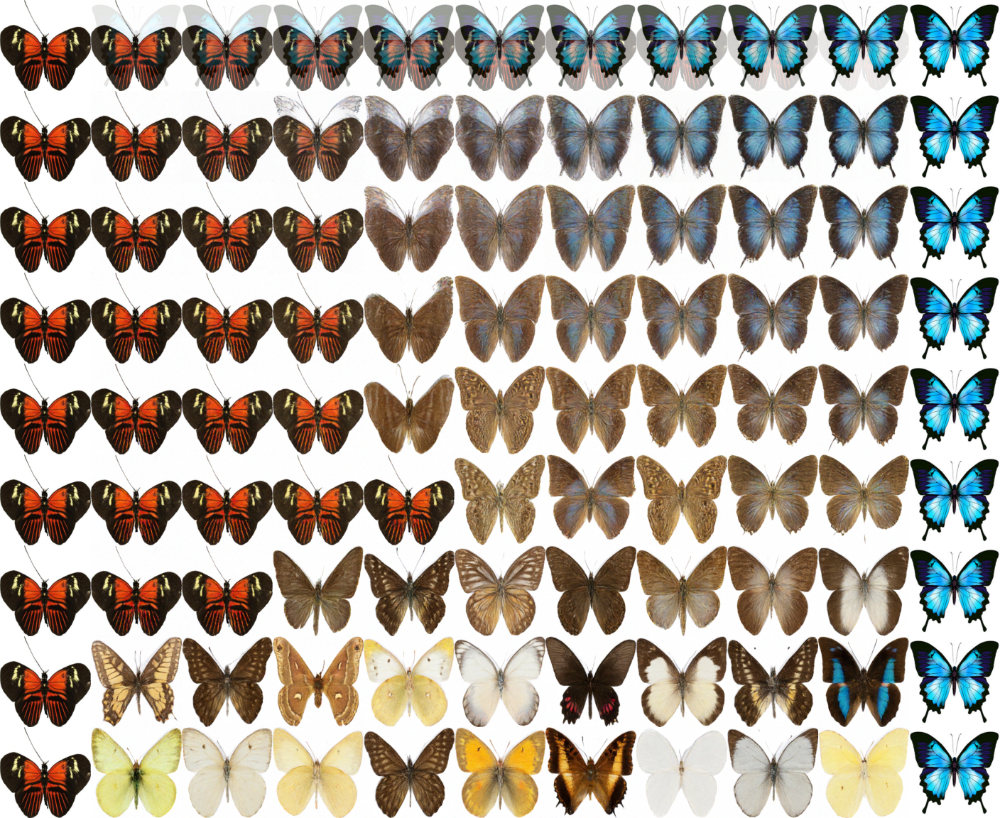

In [11]:
imgs_grid

In [12]:
imgs_grid.save("butterfly_interpolation_0.png")

In [13]:
x1 = Image.open("images/butterfly2.jpeg")
x2 = Image.open("images/butterfly3.jpeg")
x1_tensor = transform(x1).to(torch.device("cuda:6"))
x2_tensor = transform(x2).to(torch.device("cuda:6"))

In [14]:
imgs = []

imgs.append(x1_tensor.squeeze(0))
for j in range(1, 10):
    imgs.append(diffusion.interpolate(x1_tensor.unsqueeze(0), x2_tensor.unsqueeze(0), t=0, lam=j/10).squeeze(0))
imgs.append(x2_tensor.squeeze(0))

for i in range(124, 1000, 125):
    print(i)
    imgs.append(x1_tensor.squeeze(0))
    for j in range(1, 10):
        imgs.append(diffusion.interpolate(x1_tensor.unsqueeze(0), x2_tensor.unsqueeze(0), t=i, lam=j/10).squeeze(0))
    imgs.append(x2_tensor.squeeze(0))

0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]


124


124it [00:02, 57.71it/s]
124it [00:02, 56.68it/s]
124it [00:02, 57.08it/s]
124it [00:02, 57.00it/s]
124it [00:02, 57.31it/s]
124it [00:02, 57.85it/s]
124it [00:02, 58.17it/s]
124it [00:02, 58.35it/s]
124it [00:02, 58.42it/s]


249


249it [00:04, 58.45it/s]
249it [00:04, 57.97it/s]
249it [00:04, 57.41it/s]
249it [00:04, 57.86it/s]
249it [00:04, 58.31it/s]
249it [00:04, 57.91it/s]
249it [00:04, 57.75it/s]
249it [00:04, 58.22it/s]
249it [00:04, 58.58it/s]


374


374it [00:06, 58.49it/s]
374it [00:06, 58.48it/s]
374it [00:06, 58.50it/s]
374it [00:06, 58.76it/s]
374it [00:06, 57.56it/s]
374it [00:06, 57.89it/s]
374it [00:06, 58.26it/s]
374it [00:06, 58.13it/s]
374it [00:06, 57.74it/s]


499


499it [00:08, 58.39it/s]
499it [00:08, 58.22it/s]
499it [00:08, 58.04it/s]
499it [00:08, 58.40it/s]
499it [00:08, 58.34it/s]
499it [00:08, 58.13it/s]
499it [00:08, 58.13it/s]
499it [00:08, 58.36it/s]
499it [00:08, 58.29it/s]


624


624it [00:10, 59.05it/s]
624it [00:10, 58.90it/s]
624it [00:10, 58.72it/s]
624it [00:10, 58.91it/s]
624it [00:10, 58.64it/s]
624it [00:10, 57.80it/s]
624it [00:10, 58.80it/s]
624it [00:10, 58.81it/s]
624it [00:10, 58.54it/s]


749


749it [00:12, 57.62it/s]
749it [00:12, 58.53it/s]
749it [00:12, 58.54it/s]
749it [00:12, 58.92it/s]
749it [00:12, 58.53it/s]
749it [00:12, 58.86it/s]
749it [00:12, 58.77it/s]
749it [00:12, 58.13it/s]
749it [00:12, 57.62it/s]


874


874it [00:15, 57.54it/s]
874it [00:15, 57.00it/s]
874it [00:15, 57.82it/s]
874it [00:14, 58.37it/s]
874it [00:14, 58.68it/s]
874it [00:15, 58.10it/s]
874it [00:15, 58.10it/s]
874it [00:15, 57.75it/s]
874it [00:15, 56.89it/s]


999


999it [00:17, 57.28it/s]
999it [00:17, 57.80it/s]
999it [00:17, 58.20it/s]
999it [00:17, 57.85it/s]
999it [00:17, 57.71it/s]
999it [00:17, 58.03it/s]
999it [00:17, 57.26it/s]
999it [00:17, 57.50it/s]
999it [00:17, 57.95it/s]


In [15]:
# imgs = torch.stack(imgs)
imgs_grid = make_grid(imgs, 9, 11)

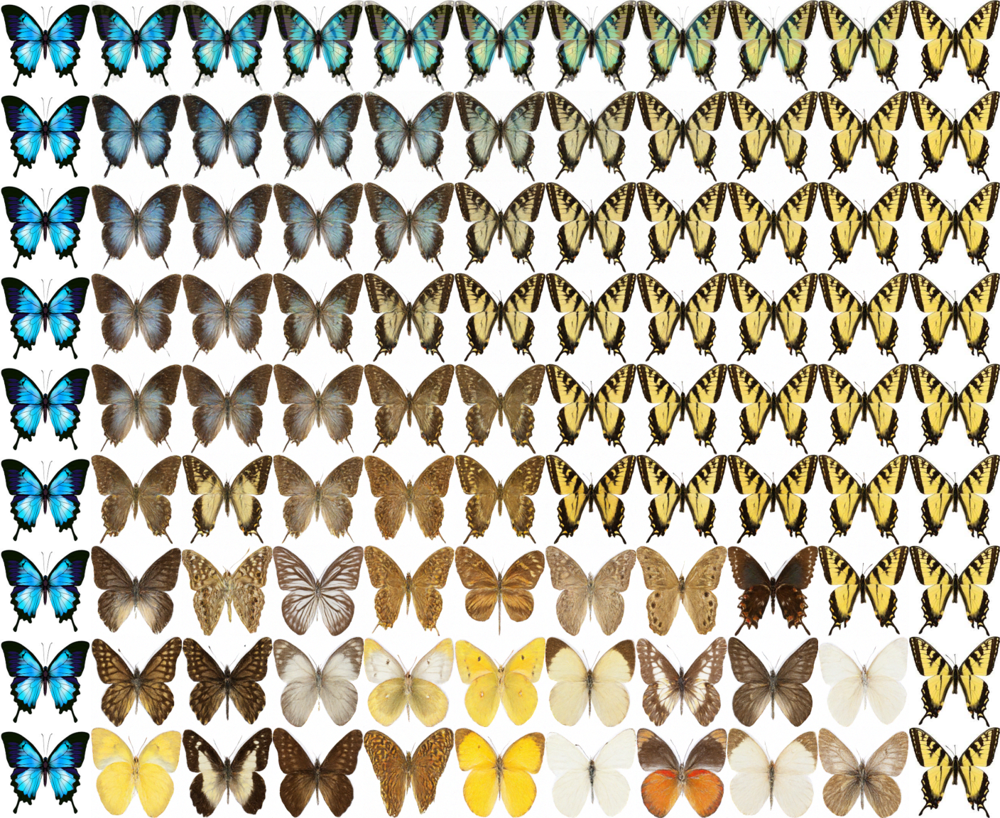

In [16]:
imgs_grid

In [17]:
imgs_grid.save("butterfly_interpolation_2.png")

## Celeb

In [18]:
diffusion.load_state_dict(torch.load("best_model_celeb.pt"), strict=False)

<All keys matched successfully>

In [19]:
x1 = Image.open("images/ronaldo.jpeg")
x2 = Image.open("images/sony.jpeg")
x1_tensor = transform(x1).to(torch.device("cuda:6"))
x2_tensor = transform(x2).to(torch.device("cuda:6"))

In [20]:
imgs = []

imgs.append(x1_tensor.squeeze(0))
for j in range(1, 10):
    imgs.append(diffusion.interpolate(x1_tensor.unsqueeze(0), x2_tensor.unsqueeze(0), t=0, lam=j/10).squeeze(0))
imgs.append(x2_tensor.squeeze(0))

for i in range(124, 1000, 125):
    print(i)
    imgs.append(x1_tensor.squeeze(0))
    for j in range(1, 10):
        imgs.append(diffusion.interpolate(x1_tensor.unsqueeze(0), x2_tensor.unsqueeze(0), t=i, lam=j/10).squeeze(0))
    imgs.append(x2_tensor.squeeze(0))

0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]


124


124it [00:02, 57.89it/s]
124it [00:02, 58.91it/s]
124it [00:02, 58.97it/s]
124it [00:02, 58.91it/s]
124it [00:02, 58.97it/s]
124it [00:02, 59.04it/s]
124it [00:02, 59.03it/s]
124it [00:02, 58.97it/s]
124it [00:02, 59.14it/s]


249


249it [00:04, 58.94it/s]
249it [00:04, 58.83it/s]
249it [00:04, 58.89it/s]
249it [00:04, 58.95it/s]
249it [00:04, 58.71it/s]
249it [00:04, 58.82it/s]
249it [00:04, 58.54it/s]
249it [00:04, 58.88it/s]
249it [00:04, 58.95it/s]


374


374it [00:06, 58.97it/s]
374it [00:06, 59.07it/s]
374it [00:06, 59.01it/s]
374it [00:06, 58.76it/s]
374it [00:06, 57.99it/s]
374it [00:06, 57.56it/s]
374it [00:06, 58.42it/s]
374it [00:06, 58.54it/s]
374it [00:06, 57.73it/s]


499


499it [00:08, 57.85it/s]
499it [00:08, 58.38it/s]
499it [00:08, 58.44it/s]
499it [00:08, 58.64it/s]
499it [00:08, 58.64it/s]
499it [00:08, 58.82it/s]
499it [00:08, 57.74it/s]
499it [00:08, 58.13it/s]
499it [00:08, 58.04it/s]


624


624it [00:10, 57.94it/s]
624it [00:10, 58.36it/s]
624it [00:10, 57.91it/s]
624it [00:10, 58.16it/s]
624it [00:10, 58.32it/s]
624it [00:10, 58.24it/s]
624it [00:10, 58.61it/s]
624it [00:10, 57.71it/s]
624it [00:10, 57.35it/s]


749


749it [00:12, 58.32it/s]
749it [00:12, 58.60it/s]
749it [00:12, 57.88it/s]
749it [00:13, 57.46it/s]
749it [00:12, 58.10it/s]
749it [00:12, 58.59it/s]
749it [00:12, 58.18it/s]
749it [00:12, 58.39it/s]
749it [00:12, 58.08it/s]


874


874it [00:15, 57.96it/s]
874it [00:14, 58.31it/s]
874it [00:14, 58.77it/s]
874it [00:14, 58.82it/s]
874it [00:14, 58.76it/s]
874it [00:14, 58.76it/s]
874it [00:14, 59.13it/s]
874it [00:14, 59.41it/s]
874it [00:14, 59.39it/s]


999


999it [00:16, 59.27it/s]
999it [00:17, 58.66it/s]
999it [00:17, 57.52it/s]
999it [00:17, 57.87it/s]
999it [00:17, 58.16it/s]
999it [00:17, 57.89it/s]
999it [00:17, 57.75it/s]
999it [00:17, 57.15it/s]
999it [00:17, 57.33it/s]


In [21]:
imgs_grid = make_grid(imgs, 9, 11)

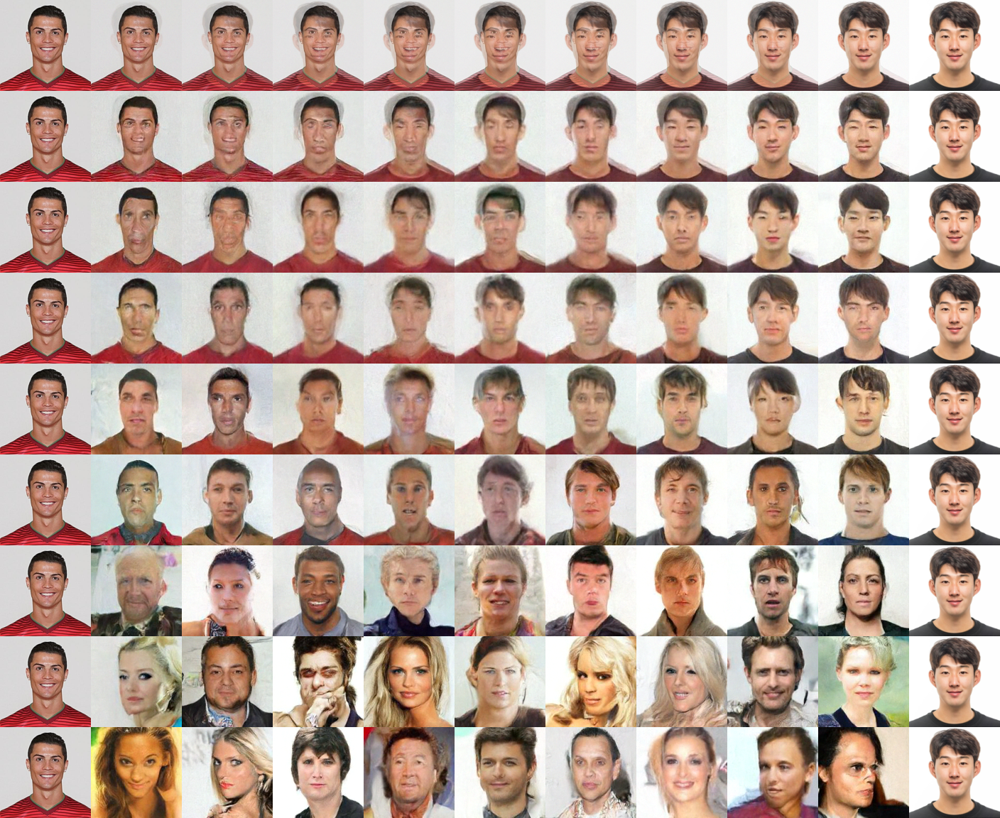

In [22]:
imgs_grid

In [24]:
imgs_grid.save("celeb_interpolation_0.png")